# Visualisation
# Course Work 1 - FFT, Filtering and Spectrograms

# Tutorial Section

In [1]:
# Here, we import all packages we need.

# This is a package for handling and manipulating data.
import pandas as pd

# This is the standard package for plotting.
from matplotlib import pyplot as plt 

# Seaborn is build on matplotlib.
# It is more comfortable to use than pure matplotlib.
import seaborn as sns

# Numpy helps us handling arrays of numbers
import numpy as np

# We use this function to calculate the fft
from numpy.fft import fft, ifft

# This shifts the output of the fft so that zero frequency is at the centre
from numpy.fft import fftshift

# The inverse of fftshift 
from numpy.fft import ifftshift

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 100

from scipy import signal, stats

from scipy.io import wavfile

import IPython.display as ipd

# Inverse FFT
We have so far only looked at the FFT, but not at its inverse that takes us from the frequency domain back to the time domain.  


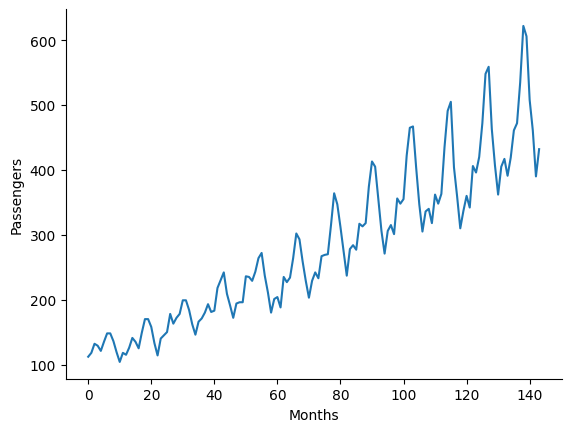

In [2]:
# We will start again with the flight dataset
flights = sns.load_dataset("flights")
passengers = np.array(flights['passengers'])
months = np.arange(passengers.size) 
sns.lineplot(x=months, y=passengers)
plt.xlabel('Months')
plt.ylabel('Passengers')
sns.despine()

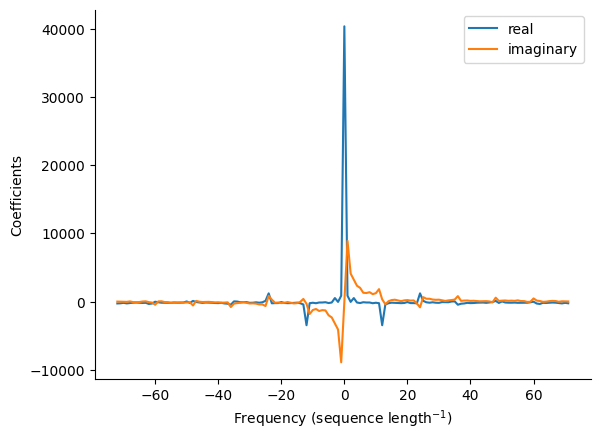

In [3]:
# We apply the FFT
passengersFFT = fftshift(fft(passengers))

# We will use this as x-axis to plot our coefficients against
freqs = np.arange(passengers.size)

# We know that zero frequency is in the centre, so we have to subtract half the length of the array
freqs = freqs - (passengers.size)//2

# Lets plot the results again
sns.lineplot(x=freqs, y=passengersFFT.real, label = 'real')
sns.lineplot(x=freqs, y=passengersFFT.imag, label = 'imaginary')
plt.ylabel('Coefficients')
# The x-axis now corresponds to the frequency as repetitions per sequence length
plt.xlabel('Frequency (sequence length$^{-1}$)')
plt.legend()
sns.despine()
plt.show()


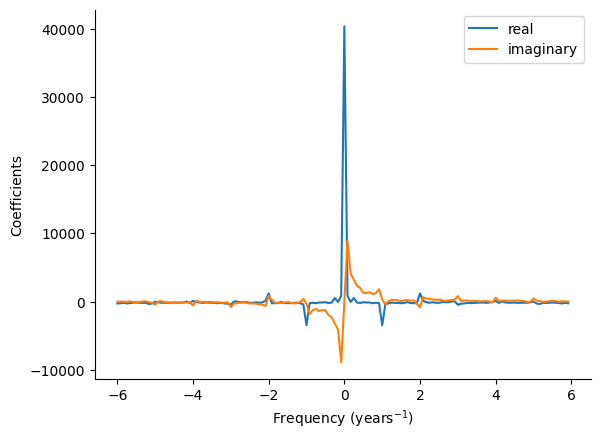

In [4]:
# We have 12 years in the time series.
freqsYears = freqs/12.0

# Lets plot the results again
sns.lineplot(x=freqsYears, y=passengersFFT.real, label = 'real')
sns.lineplot(x=freqsYears, y=passengersFFT.imag, label = 'imaginary')
plt.ylabel('Coefficients')
# The x-axis now correspods to the frequency as repetitions per sequence length
plt.xlabel('Frequency (years$^{-1}$)')
plt.legend()
sns.despine()

Let's now apply the inverse FFT.

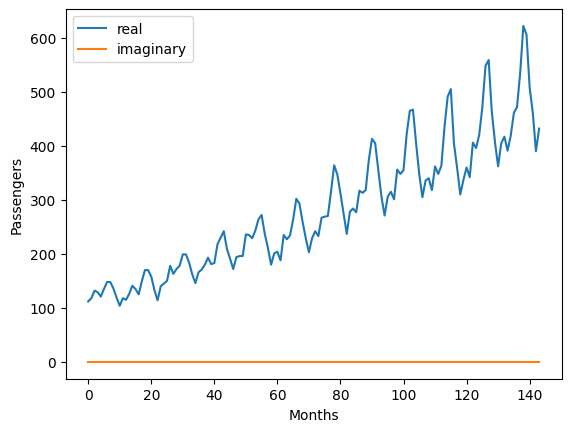

In [5]:
# we have to first apply the inverse fftshift
passengersFFT_shotfBack = ifftshift(passengersFFT)

# now we apply the inverse FFT
passangers_reconstructed = ifft(passengersFFT_shotfBack)

# lets look at the result
# Note that the result is complex.
plt.plot(passangers_reconstructed.real, label ='real')
plt.plot(passangers_reconstructed.imag, label = 'imaginary')
plt.legend()
plt.xlabel('Months')
plt.ylabel('Passengers')
plt.show()

# We only need the real part
# The imaginary part is zero (up to numerical accuracy)
passangers_reconstructed = passangers_reconstructed.real 

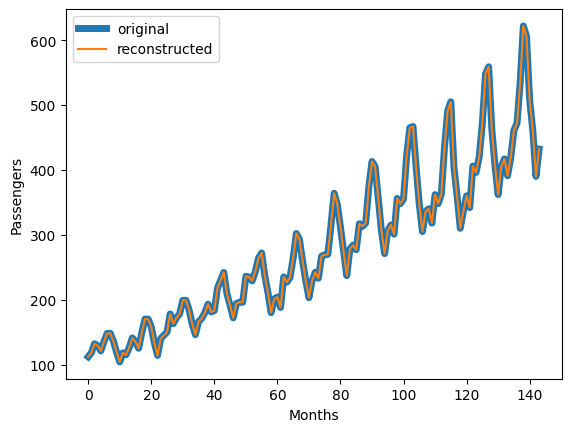

In [6]:
# The our reconstrutcion is identical to the original
plt.plot(flights['passengers'], label ='original', linewidth = 5)
plt.plot(passangers_reconstructed, label = 'reconstructed')
plt.legend()
plt.xlabel('Months')
plt.ylabel('Passengers')
plt.show()

## Filtering in Frequency Space
Here we will apply a filter, before we reconstruct the signal.
This way, we can amplify or remove frequencies.
Before we build a filter, we will make a plot of the spectrum.

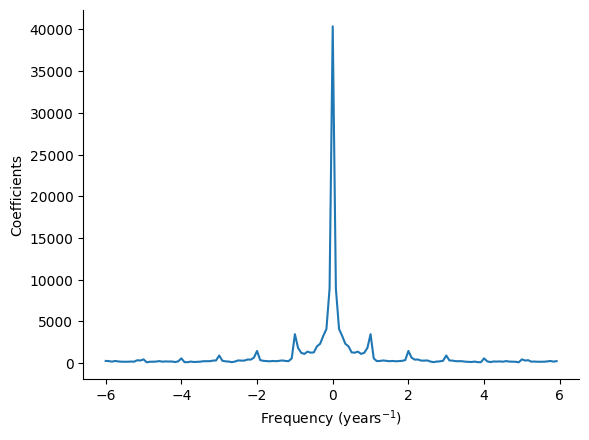

In [7]:
# We apply the FFT
passengersFFT = fftshift(fft(passengers))

# We will use this as x-axis to plot our coefficients against
freqs = np.arange(passengers.size)

# We know that zero frequency is in the centre, so we have to subtract half the length of the array
freqs = freqs - (passengers.size)//2

# We have 12 years in the time series.
freqsYears = freqs/12.0

# Lets plot the results again
sns.lineplot(x = freqsYears, y = np.abs(passengersFFT))
plt.ylabel('Coefficients')
# The x-axis now correspods to the frequency as repetitions per sequence length
plt.xlabel('Frequency (years$^{-1}$)')
sns.despine()

Let's build a filter and plot the filter weights.
## Important: to do this correctly, we have to keep also the negative frequencies and treat them in the same way as the corresponding positive ones.
Thus, the filter has to extend also to the negative part.


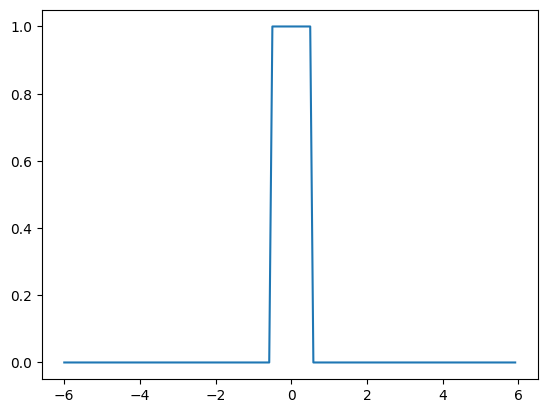

In [8]:
# We are building a brickwall filter that
# will remove all frequencies above 0.5 years^-1 
maxf = 0.5

# We start with an array of ones
weights = np.ones(len(freqsYears))

# This will set all the frequencies we want to keep to 0
weights[(freqsYears>maxf)] = 0.0

# We also have to consider the negative frequencies
weights[(freqsYears<-maxf)] = 0.0

# Let's plot the filter 
plt.plot(freqsYears, weights)

Let's now apply the filter.

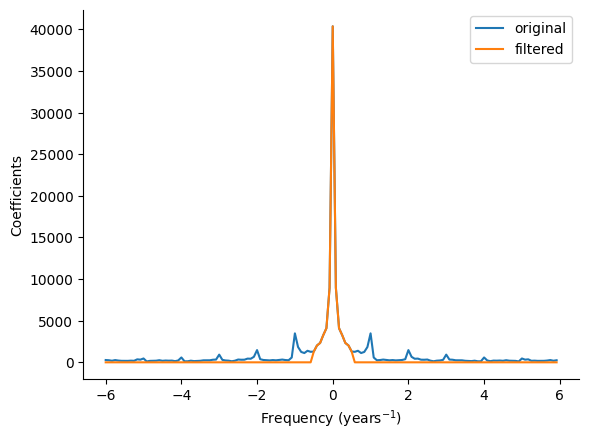

In [9]:
# We multiply the filter
passengersFFT_filtered = passengersFFT*weights

# Let's now look at the resulting spectrum
sns.lineplot(x = freqsYears, y = np.abs(passengersFFT), label = 'original')
sns.lineplot(x = freqsYears, y = np.abs(passengersFFT_filtered), label = 'filtered')
plt.ylabel('Coefficients')
# The x-axis now correspods to the frequency as repetitions per sequence length
plt.xlabel('Frequency (years$^{-1}$)')
sns.despine()
plt.legend()

Let's now look at the reconstructed filtered time series.

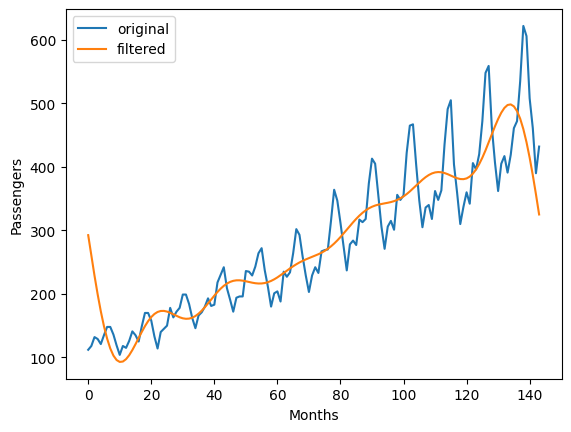

In [10]:
# we have to first apply the inverse fftshift
passengersFFT_shotfBack = ifftshift(passengersFFT_filtered)

# now we apply the inverse FFT
passangers_reconstructed = ifft(passengersFFT_shotfBack)

# We only need the real part
# The imaginary part is zero (up to numerical accuracy)
passangers_reconstructed = passangers_reconstructed.real

# The our reconstrutcion is identical to the original
plt.plot(flights['passengers'], label ='original')
plt.plot(passangers_reconstructed, label = 'filtered')
plt.legend()
plt.xlabel('Months')
plt.ylabel('Passengers')
plt.show()

## Loading Audio Samples


In [11]:
# we load the wav file
sample_rate, data = wavfile.read('./meadowlark_daniel-simion.wav')
# we get the sample rate (number of samples per second)
# and the data itself. It is stereo, i.e., has two channels.
print(sample_rate, data.shape)

# we use only one of the channels
data = data[:,0]

44100 (1792400, 2)


/var/folders/vn/9n4mdvbj54lbr8ffl0577zgw0000gn/T/ipykernel_8751/4220590897.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sample_rate, data = wavfile.read('./meadowlark_daniel-simion.wav')


In [12]:
# Let's plot the time series


In [13]:
# Let's print some stats
number_of_samples = len(data)
length_in_seconds = len(data)/sample_rate
print("number of samples:", number_of_samples)
print("length is seconds:", length_in_seconds)
print("samples per second:", sample_rate)

# We can use this to play the file
ipd.Audio(data, rate = sample_rate ) # load a local WAV file

number of samples: 1792400
length is seconds: 40.64399092970522
samples per second: 44100


Text(0, 0.5, 'signal')

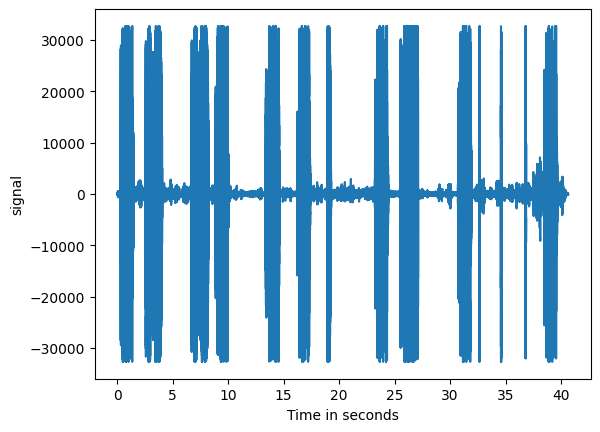

In [14]:
# Let's plot the signal
# To get the x-axis in seconds
x = np.arange(number_of_samples) / sample_rate
plt.plot(x, data)
plt.xlabel('Time in seconds')
plt.ylabel('signal')

## Spectrograms
We can create a spectrogram by using the spectrogram function provided by [scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.spectrogram.html).

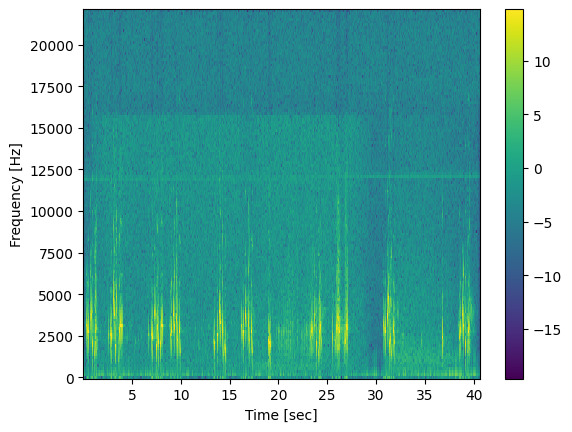

In [15]:
f, t, Sxx = signal.spectrogram(data, sample_rate)

# note that we use the logarithm before visualisation
plt.pcolormesh(t, f, np.log(Sxx))
plt.ylabel('Frequency [Hz]')

plt.xlabel('Time [sec]')

plt.colorbar()

plt.show()


Modifying the spectrogram:

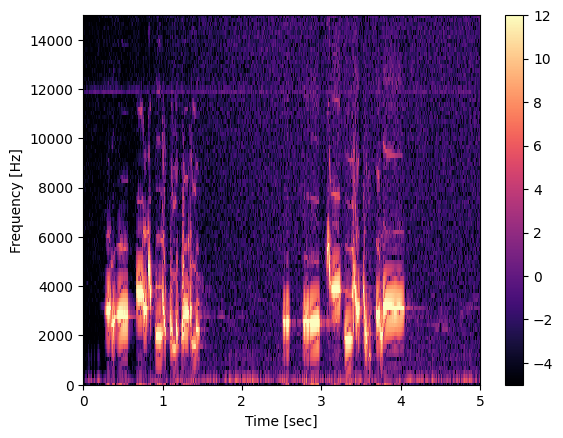

In [16]:
f, t, Sxx = signal.spectrogram(data, sample_rate)

# we can use a different colour map by setting cmap
# can choose the minimum and maximum by choosing vmin, vmax
plt.pcolormesh(t, f, np.log(Sxx), cmap = 'magma', vmin = -5, vmax = 12)

# we can choose to look only at a limited region
plt.ylabel('Frequency [Hz]')

plt.xlabel('Time [sec]')

plt.ylim(0,15000)
plt.xlim(0,5)

plt.colorbar()

plt.show()

# Exercises

## Exercise 1 (2 marks)
Load the file './Jungle-SoundBible.com-1211567897.wav' you can disregard one of the channels.
Print the number of samples, the length of the file in seconds, and the sample rate.
Listen to the file and and plot the **time series**, **the spectrum**, and **the spectrogram**. 
Make sure that the axes are labeled in a sensible way.

## Data Statistic
Nhumber of samples, length of the file in seconds and the sample rate.

In [17]:
# Load the wav file
sample_rate_animal, data_animal = wavfile.read('./Jungle-SoundBible.com-1211567897.wav')
# Get the sample rate (number of samples per second) and the data itself. It is stereo, i.e., has two channels.
print(sample_rate_animal, data_animal.shape)

# we use only one of the channels
data_animal = data_animal[:,0]

22050 (119808, 2)


In [18]:
# Stats of the file
number_of_samples_animal = len(data_animal)
length_in_seconds_animal = len(data_animal)/sample_rate_animal
print("number of samples:", number_of_samples_animal)
print("length is seconds:", length_in_seconds_animal)
print("samples per second:", sample_rate_animal)

ipd.Audio(data_animal, rate = sample_rate_animal) # Play the file

number of samples: 119808
length is seconds: 5.433469387755102
samples per second: 22050


## Time Series

Text(0, 0.5, 'signal')

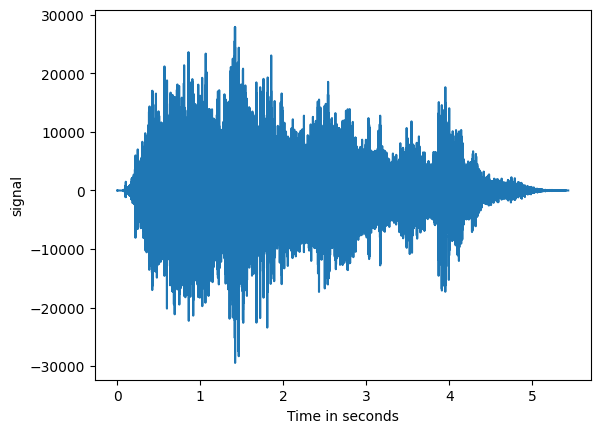

In [19]:
# Time series of the signal (x-axis in seconds)
x_animal = np.arange(number_of_samples_animal) / sample_rate_animal
plt.plot(x_animal, data_animal)
plt.xlabel('Time in seconds')
plt.ylabel('signal')

## Spectrum
Plots the spectrum, incluing both real and imaginary coefficients in seconds.

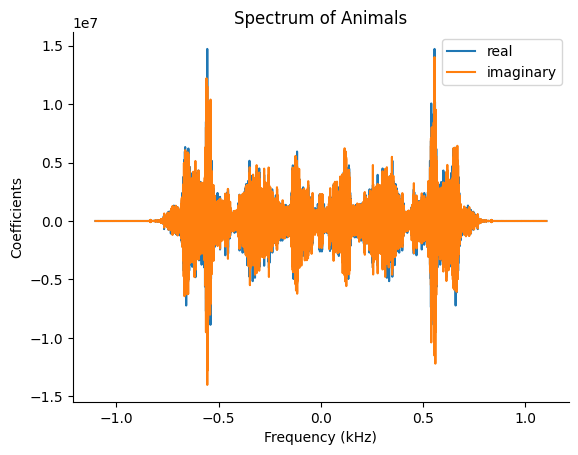

In [20]:
# We apply the FFT
animalsFFT = fftshift(fft(data_animal))

# We will use this as x-axis to plot our coefficients against
animal_freqs = np.arange(data_animal.size)

# We know that zero frequency is in the centre, so we have to subtract half the length of the array
animal_freqs = animal_freqs - (data_animal.size)//2

# Normalize by length in seconds
freqsSeconds = animal_freqs/length_in_seconds_animal    
freqsSeconds = freqsSeconds/10000                       # convert to kHz

# SPECTRUM
sns.lineplot(x=freqsSeconds, y=animalsFFT.real, label = 'real')
sns.lineplot(x=freqsSeconds, y=animalsFFT.imag, label = 'imaginary')
plt.title('Spectrum of Animals')
plt.ylabel('Coefficients')
plt.xlabel('Frequency (kHz)')
plt.legend()
sns.despine()

Now, only the real sequence is plotted to identify the different animals.

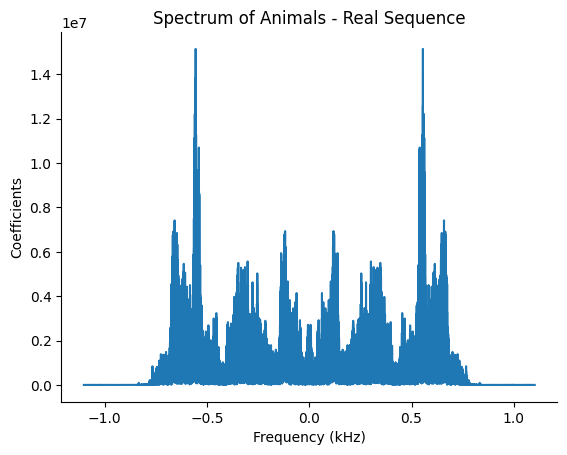

In [21]:
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT))
plt.title('Spectrum of Animals - Real Sequence')
plt.ylabel('Coefficients')
plt.xlabel('Frequency (kHz)')
sns.despine()

## Spectrogram

In [22]:
def show_spectograms(reconstruction, sample_rate): 
    f, t, Sxx = signal.spectrogram(reconstruction, sample_rate)

    fig, axes = plt.subplots(1, 2, figsize=(11, 6))

    spct1 = axes[0].pcolormesh(t, f, np.log(Sxx))
    axes[0].set_title('Spectrogram 1')
    axes[0].set_ylabel('Frequency [Hz]')
    axes[0].set_xlabel('Time [sec]')

    spect2 = axes[1].pcolormesh(t, f, np.log(Sxx), cmap = 'magma', vmin = -5, vmax = 12)
    axes[1].set_title('Spectrogram 2')
    axes[1].set_ylabel('Frequency [Hz]')
    axes[1].set_xlabel('Time [sec]')

    fig.colorbar(spct1, ax=axes[0], orientation="horizontal")
    fig.colorbar(spect2, ax=axes[1], orientation="horizontal")

    plt.tight_layout()
    plt.show()

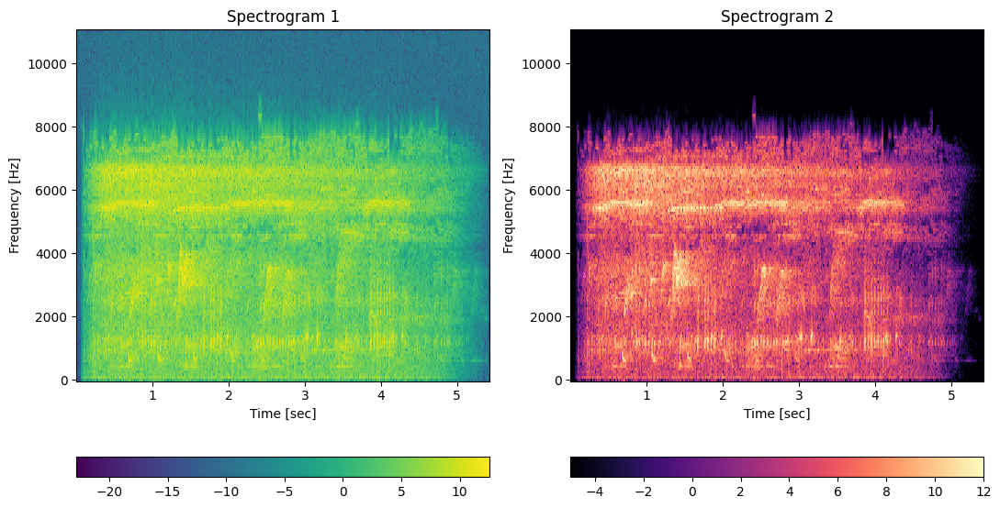

In [23]:
show_spectograms(data_animal, sample_rate_animal)

## Exercise 2 (6 marks)
The audio file contains sounds produced by different animals.
Try to identify which parts of the spectrum belong to different animals.
Design 3 different filters that each isolate the sound produced by 3 types of animal.
Each filter should roughly conserve only the frequency range of one animal type and remove all other frequencies above and below that range.
It can help to use 'plt.xlim' and 'plt.ylim' to zoom in on different parts of the spectrogram and find the correct parts of the spectrum.
It can also be very useful to change 'vmin' and 'vmax' to find the animals.

After filtering the signal, listen to the results to make sure that you have roughly isolated the animal.
Finally, **make one spectrogram for each filtered signal**.


## Brickwall Filters
First, we define and plot the Brickwall filters of the 3 different animals based on the previously plotted spectrum.
From the plot we can identify the following animals: 
- Animal 1: x < -0.4 AND x > 0.4
- Animal 2: -0.4 < x < -0.2 AND 0.2 < x < 0.4
- Animal 3: -0.2 < x < 0.2

In [24]:
# ANIMAL 1 - BRICKWALL FILTER
maxf_1 = 0.4

# We start with an array of ones
weights_1 = np.ones(len(freqsSeconds))

weights_1[(freqsSeconds < maxf_1) & (freqsSeconds > -maxf_1)] = 0.0 

In [25]:
# ANIMAL 2 - BRICKWALL FILTER
low_2 = 0.2
high_2 = 0.4

weights_2 = np.ones(len(freqsSeconds))

weights_2[(freqsSeconds < -high_2) | (freqsSeconds > high_2)] = 0.0
weights_2[(freqsSeconds > -low_2) & (freqsSeconds < low_2)] = 0.0

In [26]:
# ANIMAL 3 - BRICKWALL FILTER
maxf_3 = 0.2

weights_3 = np.ones(len(freqsSeconds))

weights_3[(freqsSeconds > maxf_3) | (freqsSeconds < -maxf_3)] = 0.0 

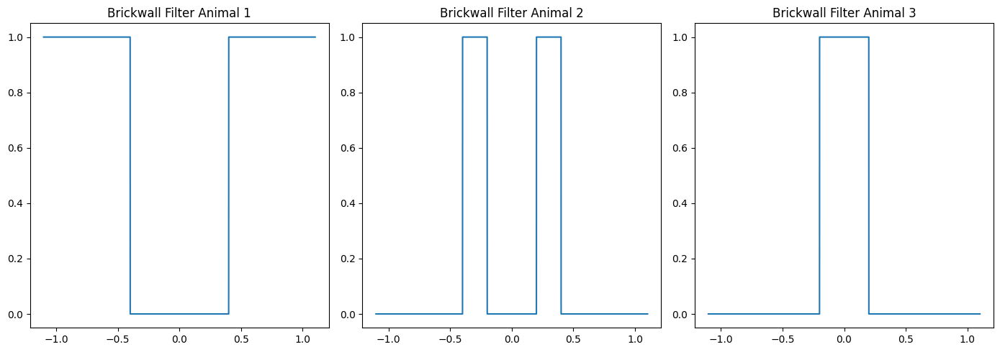

In [27]:
# Plot the 3 brickwall filters
fig, axes = plt.subplots(1, 3, figsize=(14, 5))

filter1 = axes[0].plot(freqsSeconds, weights_1)
axes[0].set_title('Brickwall Filter Animal 1')

filter2 = axes[1].plot(freqsSeconds, weights_2)
axes[1].set_title('Brickwall Filter Animal 2')

filter2 = axes[2].plot(freqsSeconds, weights_3)
axes[2].set_title('Brickwall Filter Animal 3')

plt.tight_layout()
plt.show()

## Combined Spectrum
Now, we plot the resulting filtered sequences on the original spectrum.

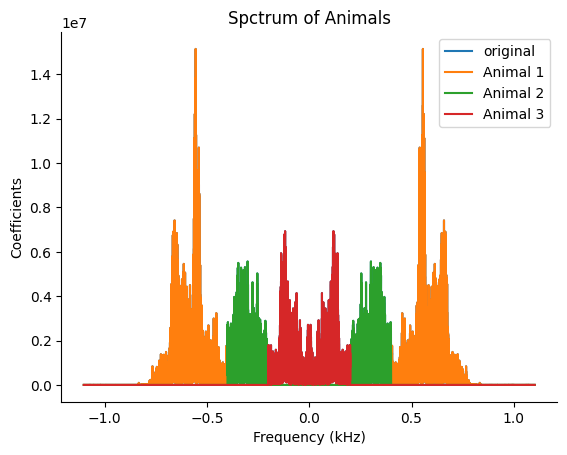

In [28]:
# We multiply the filter
animalsFFT_filtered_1 = animalsFFT*weights_1
animalsFFT_filtered_2 = animalsFFT*weights_2
animalsFFT_filtered_3 = animalsFFT*weights_3

# Let's now look at the resulting spectrum
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT), label = 'original')
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT_filtered_1), label = 'Animal 1')
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT_filtered_2), label = 'Animal 2')
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT_filtered_3), label = 'Animal 3')
plt.title('Spctrum of Animals')
plt.ylabel('Coefficients')
plt.xlabel('Frequency (kHz)')
sns.despine()
plt.legend()

## Filtered Spectograms
Finally, we plot a spectogram for each animal that has been filtered from the original frequency.

### Animal 1 - Crickets

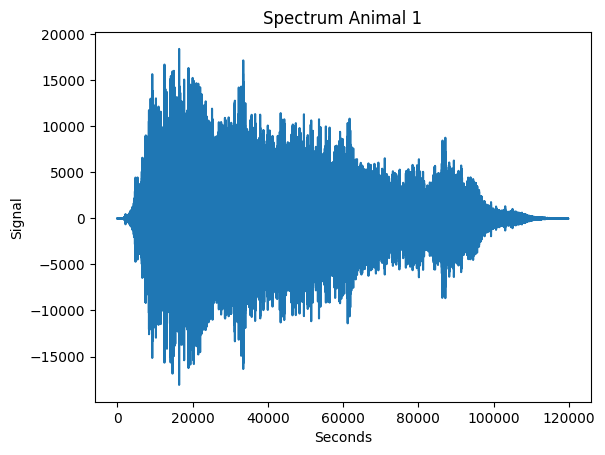

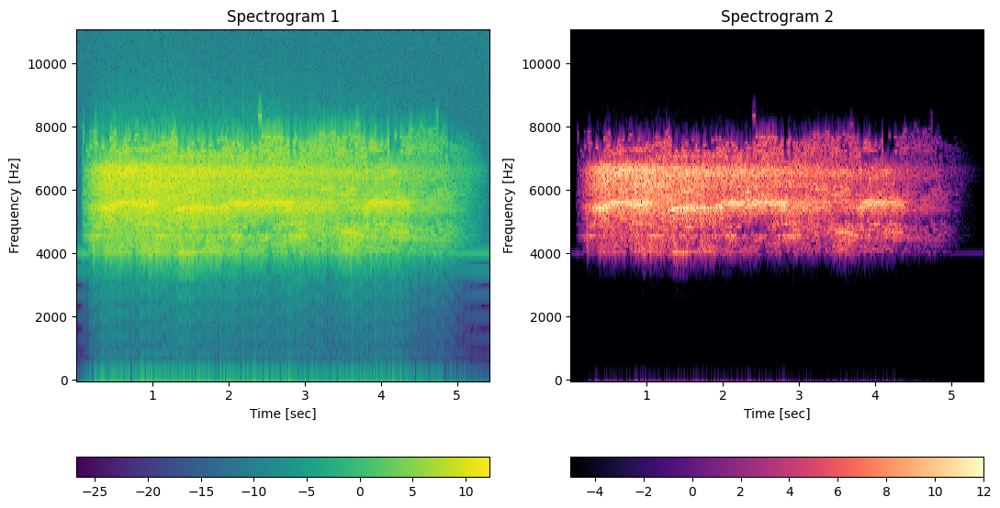

In [29]:
# ANIMAL 1 - CRICKETS
animalsFFT_shotfBack_1 = ifftshift(animalsFFT_filtered_1)   # inverse fftshift
animals_reconstructed_1 = ifft(animalsFFT_shotfBack_1)      # inverse FFT

# We only need the real part - The imaginary part is zero (up to numerical accuracy)
animals_reconstructed_1 = animals_reconstructed_1.real

# SPECTRUM
plt.plot(animals_reconstructed_1)
plt.title('Spectrum Animal 1')
plt.xlabel('Seconds')
plt.ylabel('Signal')
plt.show()

# SPECTOGRAMS
show_spectograms(animals_reconstructed_1, sample_rate_animal)

# AUDIO
ipd.Audio(animals_reconstructed_1, rate = sample_rate_animal)

### Animal 2 - Birds

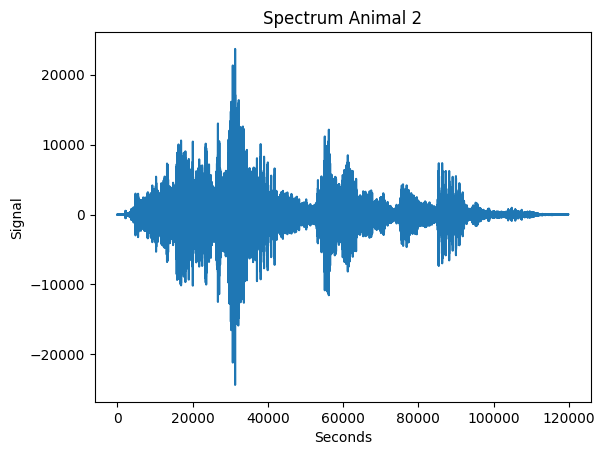

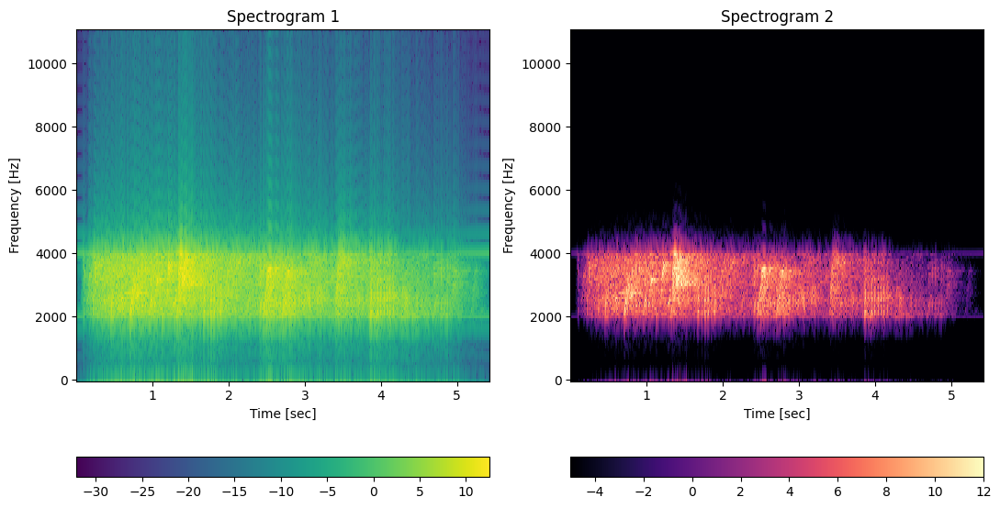

In [30]:
# ANIMAL 2 - BIRDS
animalsFFT_shotfBack_2 = ifftshift(animalsFFT_filtered_2)   # inverse fftshift
animals_reconstructed_2 = ifft(animalsFFT_shotfBack_2)      # inverse FFT

# We only need the real part - The imaginary part is zero (up to numerical accuracy)
animals_reconstructed_2 = animals_reconstructed_2.real

# PLOT
plt.plot(animals_reconstructed_2)
plt.title('Spectrum Animal 2')
plt.xlabel('Seconds')
plt.ylabel('Signal')
plt.show()

# SPECTOGRAMS
show_spectograms(animals_reconstructed_2, sample_rate_animal)

# AUDIO
ipd.Audio(animals_reconstructed_2, rate = sample_rate_animal)

### Animal 3 - Frog

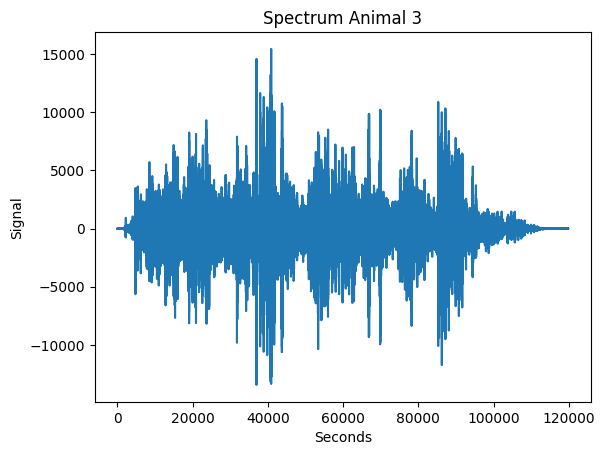

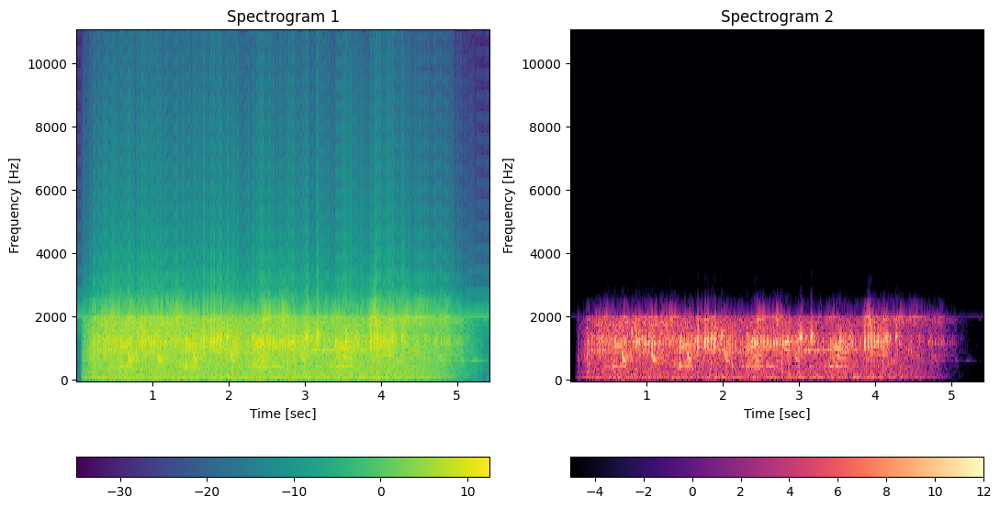

In [31]:
# ANIMAL 3 - FROGS
animalsFFT_shotfBack_3 = ifftshift(animalsFFT_filtered_3)   # inverse fftshift
animals_reconstructed_3 = ifft(animalsFFT_shotfBack_3)      # inverse FFT

# We only need the real part - The imaginary part is zero (up to numerical accuracy)
animals_reconstructed_3 = animals_reconstructed_3.real

# PLOT
plt.plot(animals_reconstructed_3)
plt.title('Spectrum Animal 3')
plt.xlabel('Seconds')
plt.ylabel('Signal')
plt.show()

# SPECTOGRAMS
show_spectograms(animals_reconstructed_3, sample_rate_animal)

# AUDIO
ipd.Audio(animals_reconstructed_3, rate = sample_rate_animal)

## Exercise 3 (2 marks)
So far we have used only brick wall filters that set the weight to 0 and 1 for frequencies that should be removed or retained.
Use a convolution to create a filter for one of the animals that transitions more smoothly between areas of the spectrum that are removed and that are retained.
Plot the **filter weights** and make a **spectrogram after filtering**.

### Gaussian Kernel
We perform a convolution between a gaussian kernel and the brickwall filters to obtain a smoother transition between areas of the spectrum.

In [32]:
# Gaussian Kernel
# def gaussian(sigma, data):
#     return np.exp(-0.5 * (data / sigma)**2)

In [33]:
def gaussian(sigma, data):
    n = len(data)
    return [np.exp(-sigma * ((i / n - 0.5) ** 2)) for i in range(n)]

In [34]:
# Define different gaussian kernels to be applied to the brickwall filters
gaussian_kernel_1 = gaussian(8, data=animal_freqs)
gaussian_kernel_2 = gaussian(7, data=animal_freqs)
gaussian_kernel_3 = gaussian(6, data=animal_freqs)

In [35]:
# Perform convolution between brickwall filter and gaussian kernel
gaussian_filter_1 = weights_1 * gaussian_kernel_1
gaussian_filter_2 = weights_2 * gaussian_kernel_2
gaussian_filter_3 = weights_3 * gaussian_kernel_3

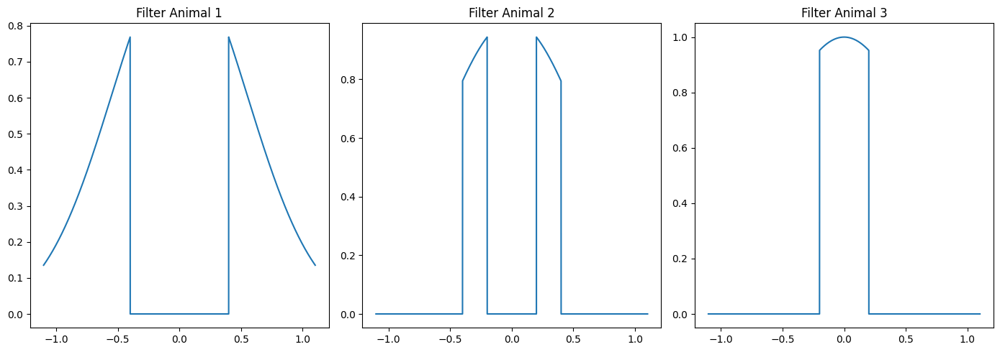

In [36]:
# Plot the 3 gaussian filters
fig, axes = plt.subplots(1, 3, figsize=(14, 5))

g_filter1 = axes[0].plot(freqsSeconds, gaussian_filter_1)
axes[0].set_title('Filter Animal 1')

g_filter2 = axes[1].plot(freqsSeconds, gaussian_filter_2)
axes[1].set_title('Filter Animal 2')

g_filter2 = axes[2].plot(freqsSeconds, gaussian_filter_3)
axes[2].set_title('Filter Animal 3')

plt.tight_layout()
plt.show()

### Filtered Spectrogram

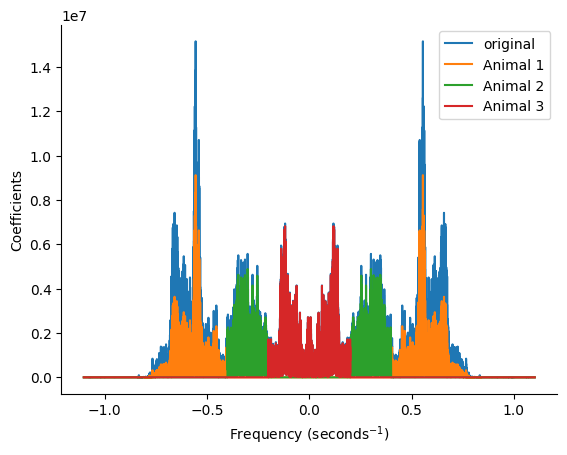

In [37]:
animalsFFT_filtered_gaussian_1 = animalsFFT*gaussian_filter_1
animalsFFT_filtered_gaussian_2 = animalsFFT*gaussian_filter_2
animalsFFT_filtered_gaussian_3 = animalsFFT*gaussian_filter_3

# PLOT
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT), label = 'original')
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT_filtered_gaussian_1), label = 'Animal 1')
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT_filtered_gaussian_2), label = 'Animal 2')
sns.lineplot(x = freqsSeconds, y = np.abs(animalsFFT_filtered_gaussian_3), label = 'Animal 3')
plt.ylabel('Coefficients')

plt.xlabel('Frequency (seconds$^{-1}$)')
sns.despine()
plt.legend()


### Animal 1 - Crickets

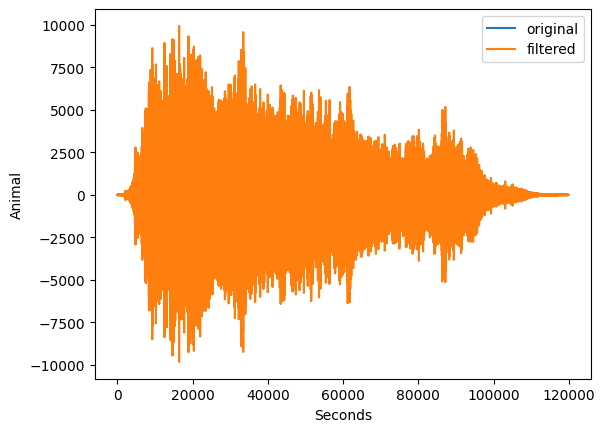

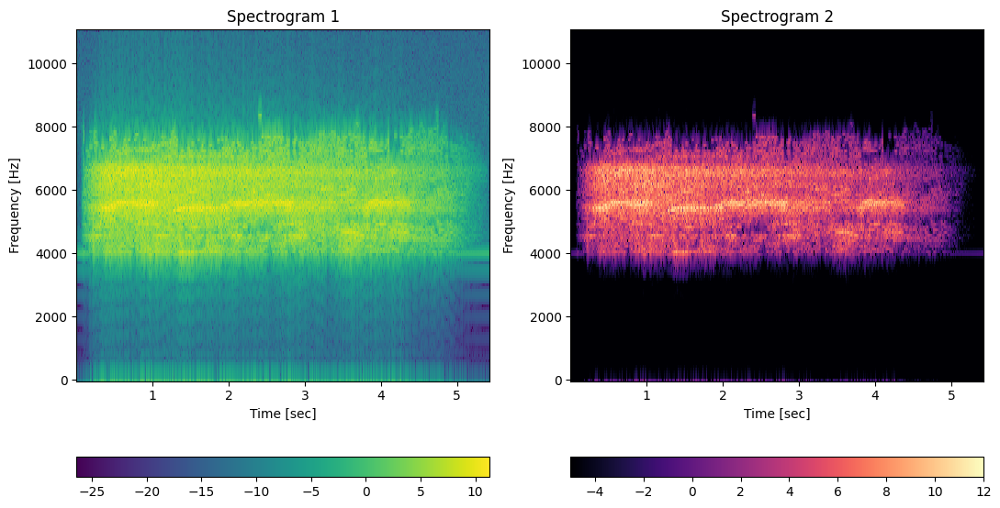

In [38]:
animalsFFT_shotfBack_gaussian_1 = ifftshift(animalsFFT_filtered_gaussian_1) # Inverse fftshift
animals_reconstructed_gaussian_1 = ifft(animalsFFT_shotfBack_gaussian_1)    # Inverse FFT

# We only need the real part - the imaginary part is zero (up to numerical accuracy)
animals_reconstructed_gaussian_1 = animals_reconstructed_gaussian_1.real

# SPECTRUM
plt.plot(x_animal, label ='original')
plt.plot(animals_reconstructed_gaussian_1, label = 'filtered')
plt.legend()
plt.xlabel('Seconds')
plt.ylabel('Animal')
plt.show()

# SPECTOGRAMS
show_spectograms(animals_reconstructed_gaussian_1, sample_rate_animal)

# AUDIO
ipd.Audio(animals_reconstructed_gaussian_1, rate = sample_rate_animal)

### Animal 2 - Birds

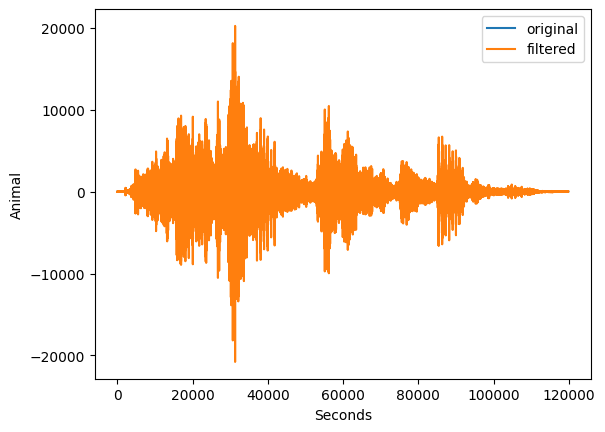

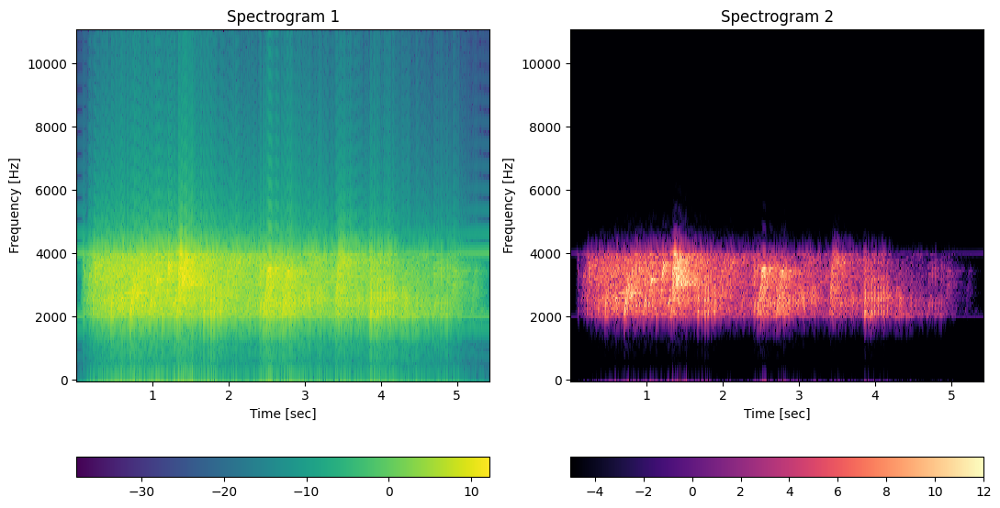

In [39]:
animalsFFT_shotfBack_gaussian_2 = ifftshift(animalsFFT_filtered_gaussian_2) # Inverse fftshift
animals_reconstructed_gaussian_2 = ifft(animalsFFT_shotfBack_gaussian_2)    # Inverse FFT

# We only need the real part - The imaginary part is zero (up to numerical accuracy)
animals_reconstructed_gaussian_2 = animals_reconstructed_gaussian_2.real

# SPECTRUM
plt.plot(x_animal, label ='original')
plt.plot(animals_reconstructed_gaussian_2, label = 'filtered')
plt.legend()
plt.xlabel('Seconds')
plt.ylabel('Animal')
plt.show()

# SPECTOGRAMS
show_spectograms(animals_reconstructed_gaussian_2, sample_rate_animal)

# AUDIO
ipd.Audio(animals_reconstructed_gaussian_2, rate = sample_rate_animal)

### Animal 3 - Frogs

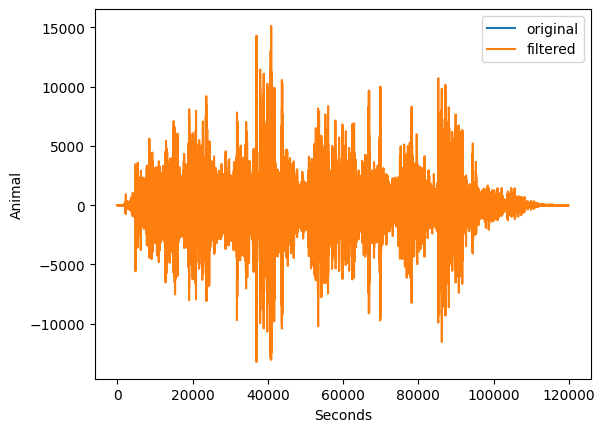

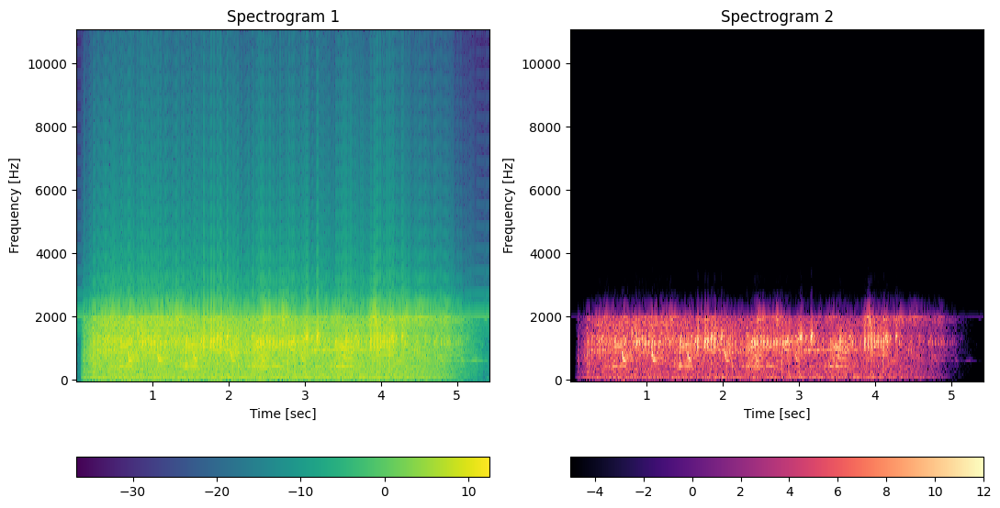

In [40]:
animalsFFT_shotfBack_gaussian_3 = ifftshift(animalsFFT_filtered_gaussian_3)     # Inverse fftshift
animals_reconstructed_gaussian_3 = ifft(animalsFFT_shotfBack_gaussian_3)        # Inverse FFT

# We only need the real part - the imaginary part is zero (up to numerical accuracy)
animals_reconstructed_gaussian_3 = animals_reconstructed_gaussian_3.real

# SPECTRUM
plt.plot(x_animal, label ='original')
plt.plot(animals_reconstructed_gaussian_3, label = 'filtered')
plt.legend()
plt.xlabel('Seconds')
plt.ylabel('Animal')
plt.show()

# SPECTOGRAMS
show_spectograms(animals_reconstructed_gaussian_3, sample_rate_animal)

# AUDIO
ipd.Audio(animals_reconstructed_gaussian_3, rate = sample_rate_animal)